In [19]:
import calliope
import pandas as pd
import plotly.express as px

/var/folders/hw/y4klzjqd4r9b2k9kpqcs_qth0000gn/T/ipykernel_4030/919326333.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/hw/y4klzjqd4r9b2k9kpqcs_qth0000gn/T/ipykernel_4030/919326333.py:160: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/Users/tomdebruin/miniforge3/envs/calliope/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



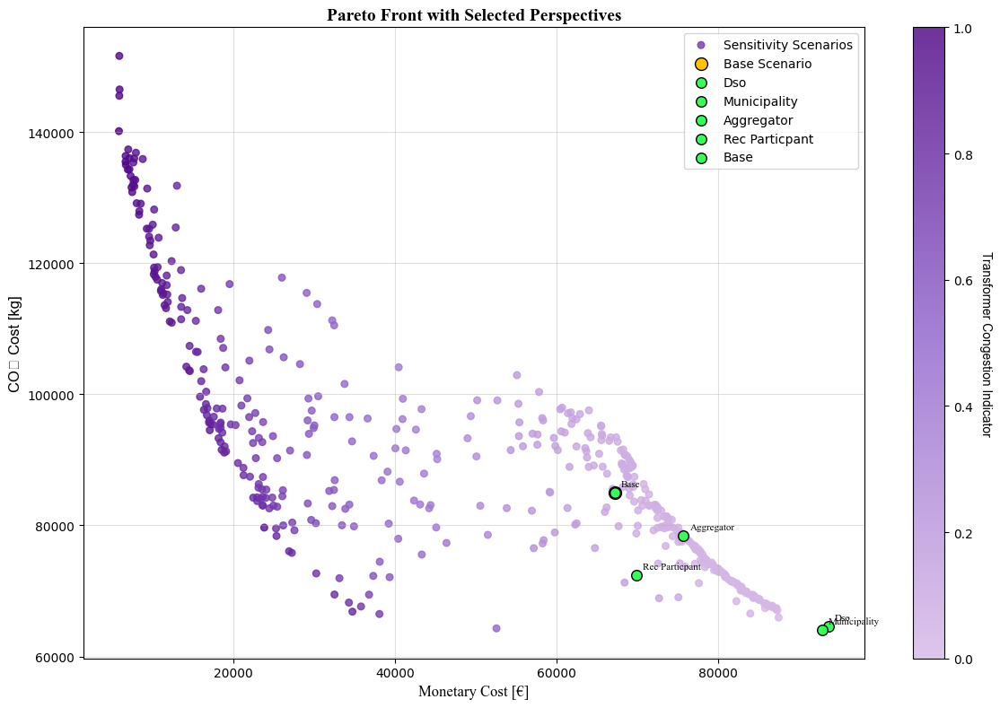

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import xarray as xr
import os
import re

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
FILE_PATH = '/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs_dirichlet/all_results.csv'  # Pareto front results
BASE_SCENARIO_PATH = '/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/model.nc'
PERSPECTIVES_DIR = './perspective_runs'  # Folder containing perspective_[name].nc
WEIGHTS_DIR = '/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs_dirichlet'

# ----------------------------
# 📊 Load Dataset
# ----------------------------
# Load Pareto Front data
data = pd.read_csv(FILE_PATH)

# Extract relevant columns
pareto_data = data[["monetary_cost", "co2_cost", "transformer_congestion_indicator"]]

# ----------------------------
# 🛠️ Filter Extreme Values
# ----------------------------
# Define thresholds to filter extreme values
monetary_cost_threshold = pareto_data["monetary_cost"].quantile(0.98)
co2_cost_threshold = pareto_data["co2_cost"].quantile(0.98)
transformer_cost_threshold = pareto_data["transformer_congestion_indicator"].quantile(0.98)

# Filter dataset
filtered_data = pareto_data[
    (pareto_data["monetary_cost"] <= monetary_cost_threshold) &
    (pareto_data["co2_cost"] <= co2_cost_threshold) &
    (pareto_data["transformer_congestion_indicator"] <= transformer_cost_threshold)
]

# Standardize transformer congestion indicator between 0 and 1
filtered_data["transformer_congestion_indicator"] = (
    (filtered_data["transformer_congestion_indicator"] - filtered_data["transformer_congestion_indicator"].min()) /
    (filtered_data["transformer_congestion_indicator"].max() - filtered_data["transformer_congestion_indicator"].min())
)

# ----------------------------
# 📊 Load Base Scenario Data
# ----------------------------
try:
    base_model = xr.open_dataset(BASE_SCENARIO_PATH)
    base_monetary_cost = base_model['cost'].sel(costs='monetary').sum().values.item()
    base_co2_cost = base_model['cost'].sel(costs='co2_emissions').sum().values.item()
    base_transformer_cost = base_model['cost'].sel(costs='transformer_congestion_indicator').sum().values.item()
    
    base_data = {
        "monetary_cost": base_monetary_cost,
        "co2_cost": base_co2_cost,
        "transformer_congestion_indicator": base_transformer_cost
    }
    
    base_data["transformer_congestion_indicator"] = (
        (base_data["transformer_congestion_indicator"] - filtered_data["transformer_congestion_indicator"].min()) /
        (filtered_data["transformer_congestion_indicator"].max() - filtered_data["transformer_congestion_indicator"].min())
    )
    
except KeyError as e:
    raise KeyError(f"[ERROR] Missing required variable in base scenario file: {e}")
except Exception as e:
    raise RuntimeError(f"[ERROR] Failed to process base scenario file: {e}")

# ----------------------------
# 📊 Load Perspectives Data
# ----------------------------
perspective_files = [f for f in os.listdir(PERSPECTIVES_DIR) if f.endswith('.nc')]
perspectives_data = []

for file in perspective_files:
    file_path = os.path.join(PERSPECTIVES_DIR, file)
    scenario_name = re.sub(r'perspective_(.+)\.nc', r'\1', file).replace('_', ' ').title()
    
    try:
        perspective_model = xr.open_dataset(file_path)
        monetary_cost = perspective_model['cost'].sel(costs='monetary').sum().values.item()
        co2_cost = perspective_model['cost'].sel(costs='co2_emissions').sum().values.item()
        transformer_cost = perspective_model['cost'].sel(costs='transformer_congestion_indicator').sum().values.item()
        
        perspectives_data.append({
            "scenario": scenario_name,
            "monetary_cost": monetary_cost,
            "co2_cost": co2_cost,
            "transformer_congestion_indicator": transformer_cost
        })
    except Exception as e:
        print(f"[ERROR] Failed to process perspective '{file}': {e}")

# Create DataFrame for perspectives
df_perspectives = pd.DataFrame(perspectives_data)

# ----------------------------
# 🎨 Visualization Settings
# ----------------------------
accenture_cmap = LinearSegmentedColormap.from_list(
    "accenture", ["#D6B8E6", "#9063CD", "#4B0082"]
)

# ----------------------------
# 📊 Plot Pareto Front with Perspectives
# ----------------------------
plt.figure(figsize=(12, 8))

# Plot sensitivity scenarios
scatter = plt.scatter(
    filtered_data["monetary_cost"],
    filtered_data["co2_cost"],
    c=filtered_data["transformer_congestion_indicator"],
    cmap=accenture_cmap,
    alpha=0.8,
    s=30,
    label="Sensitivity Scenarios"
)

# Highlight Base Scenario
plt.scatter(
    base_data["monetary_cost"],
    base_data["co2_cost"],
    color="#FFC300",
    edgecolor="black",
    s=100,
    label="Base Scenario"
)

# Highlight Perspectives
for _, row in df_perspectives.iterrows():
    plt.scatter(
        row["monetary_cost"],
        row["co2_cost"],
        color="#33FF57",  # Bright Green for perspectives
        edgecolor="black",
        s=70,
        label=row["scenario"]
    )
    plt.annotate(
        row["scenario"],
        (row["monetary_cost"], row["co2_cost"]),
        textcoords="offset points",
        xytext=(5, 5),
        fontsize=8,
        fontname='Times New Roman'
    )

# Add legend and color bar
cbar = plt.colorbar(scatter)
cbar.set_label("Transformer Congestion Indicator", rotation=270, labelpad=15, fontname='Arial')

plt.xlabel("Monetary Cost [€]", fontname='Times New Roman', fontsize=12)
plt.ylabel("CO₂ Cost [kg]", fontname='Arial', fontsize=12)
plt.title("Pareto Front with Selected Perspectives", fontname='Times New Roman', fontsize=14, fontweight='bold')
plt.legend(loc='upper right', fontsize=10, frameon=True)
plt.grid(alpha=0.4)
plt.tight_layout()

plt.show()

Design


In [5]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
PERSPECTIVE_DIR = "./perspective_runs"
OUTPUT_PLOTS_DIR = "./perspective_plots"

os.makedirs(OUTPUT_PLOTS_DIR, exist_ok=True)

# Technology color mapping (aligned with YAML)
tech_colors = {
    "supply_grid_power": "#6E42A1",  # Dark Gray
    "solar_power": "#a100ff",       # Core Purple 1
    "unmet_demand": "#d62128",      # Red
    "demand_power": "#000000",      # Black
    "sell_grid_power": "#4B286D",   # Dark Purple
    "curtailment": "#dcafff",       # Accent Purple 4
    "transformer_in": "#756584",    # Muted Purple-Gray
    "transformer_out": "#756584",   # Muted Purple-Gray
    "pv": "#7500c0",                # Core Purple 2
    "battery": "#be82ff",           # Accent Purple 3
    "battery_central": "#93115f",   # Dark Magenta
}

# Technology names from YAML
tech_names = {
    "supply_grid_power": "Grid import",
    "solar_power": "Solar power",
    "unmet_demand": "Unmet demand",
    "demand_power": "Power demand",
    "sell_grid_power": "Grid export",
    "curtailment": "Curtailment",
    "transformer_in": "Transformer in",
    "transformer_out": "Transformer out",
    "pv": "PV",
    "battery": "Battery storage",
    "battery_central": "Battery storage (central)"
}

# ----------------------------
# 📊 Process All Scenarios to Get Maximum Y-Axis Limit
# ----------------------------
def get_max_y_value():
    max_y = 0
    for file in os.listdir(PERSPECTIVE_DIR):
        if file.endswith(".nc"):
            try:
                model = xr.open_dataset(os.path.join(PERSPECTIVE_DIR, file))
                if "flow_cap" in model.variables:
                    total_capacity = model["flow_cap"].sum(dim="nodes").sum().values.item()
                    max_y = max(max_y, total_capacity)
            except Exception as e:
                print(f"[WARNING] Failed to process {file}: {e}")
    return max_y * 1.1  # Add 10% buffer for better visualization


# ----------------------------
# 📊 Scenario Plotting Function
# ----------------------------
def process_and_plot_scenario(file_path, scenario_name, y_max):
    try:
        # Load the model data
        model = xr.open_dataset(file_path)
        
        if "flow_cap" not in model.variables:
            raise ValueError(f"Required variable 'flow_cap' missing in {scenario_name} dataset.")

        # Extract installed capacity
        df_capacity = (
            model["flow_cap"]
            .sum(dim="nodes")
            .to_dataframe(name="installed_capacity")
            .reset_index()
        )

        # Define technology groups
        selected_techs_power_PV = ["solar_power", "curtailment"]
        selected_techs_power_LV = ["pv", "battery"]
        selected_techs_power_MV = ["sell_grid_power", "supply_grid_power", "battery_central"]

        # Process PV explicitly (divide aggregated value by 2)
        df_pv = df_capacity[df_capacity["techs"] == "pv"].copy()
        if not df_pv.empty:
            df_pv["installed_capacity"] = df_pv["installed_capacity"] / 2

        # Filter technologies
        df_power_PV = df_capacity[df_capacity["techs"].isin(selected_techs_power_PV)].copy()
        df_power_LV = df_capacity[df_capacity["techs"].isin(selected_techs_power_LV)].copy()
        df_power_MV = df_capacity[df_capacity["techs"].isin(selected_techs_power_MV)].copy()

        # Replace original pv values with adjusted ones
        df_power_LV = df_power_LV[df_power_LV["techs"] != "pv"]
        df_power_LV = pd.concat([df_power_LV, df_pv], ignore_index=True)

        # Plot stacked bar chart
        fig, ax = plt.subplots(figsize=(6, 8))
        bar_width = 0.8
        bar_positions = np.arange(3)

        # Plot Power_PV
        bottom_pv = 0
        for tech in selected_techs_power_PV:
            values = df_power_PV[df_power_PV["techs"] == tech]["installed_capacity"].sum()
            label = tech_names.get(tech, tech)
            bar = ax.bar(
                bar_positions[0],
                values,
                bar_width,
                color=tech_colors.get(tech, "#cccccc"),
                label=label,
                bottom=bottom_pv
            )
            ax.text(
                bar_positions[0],
                bottom_pv + values / 2,
                f'{values:.0f}',
                ha='center',
                va='center',
                fontsize=8
            )
            bottom_pv += values

        # Plot Power_LV
        bottom_lv = 0
        for tech in selected_techs_power_LV:
            values = df_power_LV[df_power_LV["techs"] == tech]["installed_capacity"].sum()
            label = tech_names.get(tech, tech)
            bar = ax.bar(
                bar_positions[1],
                values,
                bar_width,
                color=tech_colors.get(tech, "#cccccc"),
                label=label,
                bottom=bottom_lv
            )
            ax.text(
                bar_positions[1],
                bottom_lv + values / 2,
                f'{values:.0f}',
                ha='center',
                va='center',
                fontsize=8
            )
            bottom_lv += values

        # Plot Power_MV
        bottom_mv = 0
        for tech in selected_techs_power_MV:
            values = df_power_MV[df_power_MV["techs"] == tech]["installed_capacity"].sum()
            label = tech_names.get(tech, tech)
            bar = ax.bar(
                bar_positions[2],
                values,
                bar_width,
                color=tech_colors.get(tech, "#cccccc"),
                label=label,
                bottom=bottom_mv
            )
            ax.text(
                bar_positions[2],
                bottom_mv + values / 2,
                f'{values:.0f}',
                ha='center',
                va='center',
                fontsize=8
            )
            bottom_mv += values

        # Formatting
        ax.set_xticks(bar_positions)
        ax.set_xticklabels(['Power PV', 'Power LV', 'Power MV'])
        ax.set_ylabel('Installed Capacity (kW)')
        ax.set_ylim(0, 2400)
        ax.set_title(f'{scenario_name} Perspective')

        plot_file = os.path.join(OUTPUT_PLOTS_DIR, f"{scenario_name}_installed_capacity.png")
        plt.tight_layout()
        plt.savefig(plot_file)
        plt.close()
        print(f"[SUCCESS] Saved plot for {scenario_name} to {plot_file}")

    except Exception as e:
        print(f"[ERROR] Failed to process scenario '{scenario_name}': {e}")


# Main Execution
if __name__ == "__main__":
    y_max = get_max_y_value()
    for file in os.listdir(PERSPECTIVE_DIR):
        if file.endswith(".nc"):
            scenario_name = file.replace(".nc", "")
            file_path = os.path.join(PERSPECTIVE_DIR, file)
            process_and_plot_scenario(file_path, scenario_name, y_max)

[SUCCESS] Saved plot for cluster_0 to ./perspective_plots/cluster_0_installed_capacity.png
[SUCCESS] Saved plot for cluster_1 to ./perspective_plots/cluster_1_installed_capacity.png
[SUCCESS] Saved plot for cluster_2 to ./perspective_plots/cluster_2_installed_capacity.png
[SUCCESS] Saved plot for cluster_3 to ./perspective_plots/cluster_3_installed_capacity.png
[SUCCESS] Saved plot for perspective_base to ./perspective_plots/perspective_base_installed_capacity.png


In [10]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
PERSPECTIVE_DIR = "./perspective_runs"
OUTPUT_PLOTS_DIR = "./perspective_plots"

os.makedirs(OUTPUT_PLOTS_DIR, exist_ok=True)

# Technology color mapping (aligned with YAML)
tech_colors = {
    "solar_power": "#942adf",       # Bright Purple
    "battery": "#5a0a4f",           # Darker Deep Purple
    "battery_central": "#93115f"    # Dark Magenta
}

# Technology names from YAML
tech_names = {
    "solar_power": "Solar power",
    "battery": "Battery storage",
    "battery_central": "Battery storage (central)"
}

# ----------------------------
# 📊 Scenario Plotting Function
# ----------------------------
def process_and_plot_all_scenarios():
    scenario_data = []

    for file in os.listdir(PERSPECTIVE_DIR):
        if file.endswith(".nc"):
            scenario_name = file.replace(".nc", "").replace("perspective_", "")
            try:
                model = xr.open_dataset(os.path.join(PERSPECTIVE_DIR, file), engine="netcdf4")
                
                if "flow_cap" not in model.variables:
                    raise ValueError(f"Required variable 'flow_cap' missing in {scenario_name} dataset.")

                # Extract installed capacity
                df_capacity = (
                    model["flow_cap"]
                    .sum(dim="nodes")
                    .to_dataframe(name="installed_capacity")
                    .reset_index()
                )

                # Filter selected technologies
                selected_techs = ["solar_power", "battery", "battery_central"]
                for tech in selected_techs:
                    capacity = df_capacity[df_capacity["techs"] == tech]["installed_capacity"].sum()
                    scenario_data.append({
                        "Scenario": scenario_name,
                        "Technology": tech_names.get(tech, tech),
                        "Installed Capacity": capacity
                    })

            except Exception as e:
                print(f"[ERROR] Failed to process {file}: {e}")

    # Convert to DataFrame for easier plotting
    df_plot = pd.DataFrame(scenario_data)

    # Pivot data for plotting
    df_pivot = df_plot.pivot_table(
        index='Scenario',
        columns='Technology',
        values='Installed Capacity',
        fill_value=0
    )

    # Ensure the stacking order: Solar power → Battery → Battery storage (central)
    df_pivot = df_pivot[['Solar power', 'Battery storage', 'Battery storage (central)']]

    # ----------------------------
    # 📊 Plot Horizontal Bar Chart with Numbers
    # ----------------------------
    fig, ax = plt.subplots(figsize=(10, max(4, len(df_pivot) * 0.5)))  # Compact height

    bars = df_pivot.plot(
        kind='barh',
        stacked=True,
        color=[tech_colors['solar_power'], tech_colors['battery'], tech_colors['battery_central']],
        ax=ax
    )

    # Add exact capacity numbers on each bar segment
    for i, scenario in enumerate(df_pivot.index):
        cumulative_width = 0
        for tech in ['Solar power', 'Battery storage', 'Battery storage (central)']:
            value = df_pivot.at[scenario, tech]
            if value > 0:
                ax.text(
                    cumulative_width + (value / 2),
                    i,
                    f'{value:.0f} kW',
                    ha='center',
                    va='center',
                    fontsize=8,
                    color='white'
                )
                cumulative_width += value

    # Formatting
    ax.set_xlabel('Installed Capacity (kW)', fontname='Times New Roman')
    ax.set_ylabel('Scenarios', fontname='Times New Roman')
    ax.set_title('Installed Capacity Across Scenarios', fontname='Times New Roman')
    ax.legend(title='Technology', loc='lower right', fontsize=8)

    # Apply Times New Roman font
    plt.rcParams['font.family'] = 'Times New Roman'

    # Save plot
    plot_file = os.path.join(OUTPUT_PLOTS_DIR, "all_scenarios_installed_capacity.png")
    plt.xlim(0, 2000)
    plt.tight_layout()
    plt.savefig(plot_file)
    plt.close()

    print(f"[SUCCESS] Saved plot for all scenarios to {plot_file}")


# Main Execution
if __name__ == "__main__":
    process_and_plot_all_scenarios()

[SUCCESS] Saved plot for all scenarios to ./perspective_plots/all_scenarios_installed_capacity.png


In [8]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
SCENARIO_DIR = "./perspective_runs"
BASE_SCENARIO = "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/sensitivity/sensitivity_analysis_runs/base.nc"

# Verify if directories exist
if not os.path.exists(SCENARIO_DIR):
    raise FileNotFoundError(f"The directory '{SCENARIO_DIR}' does not exist. Run scenarios first!")
if not os.path.exists(BASE_SCENARIO):
    raise FileNotFoundError(f"The base scenario file '{BASE_SCENARIO}' does not exist.")

# ----------------------------
# 🎨 Visualization Settings
# ----------------------------
tech_colors = {
    "supply_grid_power": "#96968c",  
    "solar_power": "#942adf",        
    "unmet_demand": "#d62128",       
    "sell_grid_power": "#e6e6dc",    
    "curtailment": "#b03060",        
    "pv": "#460073",                 
    "battery": "#5a0a4f",            
    "battery_central": "#5a0a3f"     
}

tech_carriers = {
    "solar_power": "Power PV",
    "curtailment": "Power PV",
    "pv": "Power LV",
    "battery": "Power LV",
    "sell_grid_power": "Power MV",
    "supply_grid_power": "Power MV",
    "battery_central": "Power MV",
    "unmet_demand": "Other"
}

# Sorting order for categories
carrier_sort_order = ["Power PV", "Power LV", "Power MV", "Other"]

# Selected technologies
selected_techs_power_PV = ["solar_power", "curtailment"]
selected_techs_power_LV = ["pv", "battery"]
selected_techs_power_MV = ["sell_grid_power", "supply_grid_power", "battery_central"]
selected_techs_other = ["unmet_demand"]

selected_techs = selected_techs_power_PV + selected_techs_power_LV + selected_techs_power_MV + selected_techs_other

# ----------------------------
# 📊 Extract Installed Capacity from NetCDF
# ----------------------------
def extract_installed_capacity(file_path):
    """
    Extract installed capacity per technology from a NetCDF file.
    """
    try:
        model = xr.open_dataset(file_path)
        df_capacity = (
            model["flow_cap"]
            .sum(dim="nodes")
            .to_dataframe(name="installed_capacity")
            .reset_index()
        )

        # Handle PV double counting
        df_pv = df_capacity[df_capacity["techs"] == "pv"].copy()
        if not df_pv.empty:
            df_pv["installed_capacity"] = df_pv["installed_capacity"] / 2
            df_capacity.loc[df_capacity["techs"] == "pv", "installed_capacity"] = df_pv["installed_capacity"]

        # Filter for selected technologies
        df_capacity = df_capacity[df_capacity["techs"].isin(selected_techs)]

        # Remove duplicate technologies, keep the first occurrence
        df_capacity = df_capacity.groupby("techs", as_index=False).agg({"installed_capacity": "sum"})

        return df_capacity
    except KeyError as e:
        print(f"[ERROR] Missing required variable in {file_path}: {e}")
        return pd.DataFrame()
    except Exception as e:
        print(f"[ERROR] Failed to process {file_path}: {e}")
        return pd.DataFrame()


# ----------------------------
# 📑 Aggregate Base Scenario and Sensitivity Scenarios
# ----------------------------
# Base scenario
df_base = extract_installed_capacity(BASE_SCENARIO)
df_base["carrier"] = df_base["techs"].map(tech_carriers).fillna("Other")

# Sensitivity scenarios
sensitivity_files = [f for f in os.listdir(SCENARIO_DIR) if f.endswith('.nc') and f != os.path.basename(BASE_SCENARIO)]
sensitivity_data = []

for scenario_file in sensitivity_files:
    scenario_path = os.path.join(SCENARIO_DIR, scenario_file)
    df_sensitivity = extract_installed_capacity(scenario_path)
    df_sensitivity["carrier"] = df_sensitivity["techs"].map(tech_carriers).fillna("Other")
    sensitivity_data.append(df_sensitivity)

# Combine all sensitivity data
df_sensitivity_combined = pd.concat(sensitivity_data, ignore_index=True)

# Calculate variance (min and max installed capacity per tech)
df_variance = df_sensitivity_combined.groupby("techs")["installed_capacity"].agg(["min", "max"]).reset_index()

# Merge with base scenario
df_plot = pd.merge(df_base, df_variance, on="techs", how="left")

# Ensure no NaN in variance columns
df_plot['min'] = np.minimum(df_plot['min'].fillna(df_plot['installed_capacity']), df_plot['installed_capacity'])
df_plot['max'] = np.maximum(df_plot['max'].fillna(df_plot['installed_capacity']), df_plot['installed_capacity'])

# ----------------------------
# 📊 Sorting by Carrier
# ----------------------------
df_plot["carrier"] = df_plot["techs"].map(tech_carriers).fillna("Other")
df_plot["carrier_order"] = df_plot["carrier"].apply(lambda x: carrier_sort_order.index(x))
df_plot = df_plot.sort_values(by=["carrier_order", "techs"]).reset_index(drop=True)

# ----------------------------
# 📊 Plotting with Carrier Brackets and Tech Names
# ----------------------------
fig, ax = plt.subplots(figsize=(14, 8))

# Track x-axis positions
x_positions = np.arange(len(df_plot))

# Plot technologies with variance
for i, row in df_plot.iterrows():
    tech = row['techs']
    base_capacity = row['installed_capacity']
    min_capacity = row['min']
    max_capacity = row['max']

    ax.bar(
        x_positions[i],
        base_capacity,
        color=tech_colors.get(tech, "#cccccc"),
        edgecolor="black"
    )

    ax.errorbar(
        x_positions[i],
        base_capacity,
        yerr=[[base_capacity - min_capacity], [max_capacity - base_capacity]],
        fmt='none',
        ecolor='black',
        capsize=5,
        capthick=1
    )

    ax.text(
        x_positions[i],
        base_capacity + 10,
        f"{base_capacity:.0f}",
        ha='center',
        va='bottom',
        fontsize=8
    )

# Add Group Brackets
for carrier in carrier_sort_order:
    indices = df_plot[df_plot["carrier"] == carrier].index.tolist()
    if indices:
        ax.plot([indices[0], indices[-1]], [-50, -50], color='black')
        ax.text((indices[0] + indices[-1]) / 2, -100, carrier, ha='center', va='center', fontsize=10, fontweight='bold')

# Add Tech Names
ax.set_xticks(x_positions)
ax.set_xticklabels(df_plot["techs"], rotation=45, ha="right", fontsize=10)

ax.set_ylabel('Installed Capacity (kW)')
ax.set_title('Installed Capacity per Technology with Variance Across Sensitivity Scenarios')
ax.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

FileNotFoundError: The base scenario file '/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/sensitivity/sensitivity_analysis_runs/base.nc' does not exist.

Operation


In [49]:
#Yearly operation plot
import plotly.express as px

# Define the file paths for the four scenarios
file_paths = {
    "REC": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p733_wc0p167_wt0p1.nc",
    "Balanced": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p667_wc0p167_wt0p167.nc",
    "DSO": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p333_wc0p267_wt0p4.nc",
    "Municipality": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p233_wc0p5_wt0p267.nc",
    "Aggregator": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p533_wc0p2_wt0p267.nc",
}

# Define a function to process and plot a scenario
def process_and_plot_scenario(file_path, scenario_name):
    # Load the model data
    model = xr.open_dataset(file_path)
    
    # Process electricity flow data
    df_electricity = (
        (model["flow_out"].fillna(0) - model["flow_in"].fillna(0))
        .sel(carriers="power")
        .sum("nodes")
        .to_series()
        .where(lambda x: x != 0)
        .dropna()
        .to_frame("Flow in/out (kWh)")
        .reset_index()
    )
    
    # Separate demand and other technologies
    df_electricity_demand = df_electricity[df_electricity.techs == "demand_power"]
    df_electricity_other = df_electricity[df_electricity.techs != "demand_power"]
    
    # Define colors for technologies
    # Use a predefined color set
    
    # Create the bar plot for other technologies
    fig = px.bar(
        df_electricity_other,
        x="timesteps",
        y="Flow in/out (kWh)",
        color="techs",
        title=f"Electricity Flow for {scenario_name} Scenario",
    )
    
    # Add demand as a scatter plot
    fig.add_scatter(
        x=df_electricity_demand.timesteps,
        y=-1 * df_electricity_demand["Flow in/out (kWh)"],
        marker_color="black",
        name="Demand",
    )
    
    # Show the plot
    fig.show()

# Process and plot each scenario
for scenario_name, file_path in file_paths.items():
    process_and_plot_scenario(file_path, scenario_name)


In [9]:
import xarray as xr
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import os
import re

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
BASE_DIR = "./perspective_runs"  # Folder containing .nc files for perspectives
OUTPUT_DIR = "./perspective_operational_plots"  # Folder for saving plots

# Verify if the input directory exists
if not os.path.exists(BASE_DIR):
    raise FileNotFoundError(f"The directory '{BASE_DIR}' does not exist.")

# Create output directory if it doesn't exist
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Automatically collect .nc files and extract scenario names
file_paths = {}
for file in os.listdir(BASE_DIR):
    if file.endswith(".nc"):
        file_path = os.path.join(BASE_DIR, file)
        match = re.match(r"perspective_(.+)\.nc", file)
        scenario_name = match.group(1).replace("_", " ").title() if match else file.replace(".nc", "")
        file_paths[scenario_name] = file_path

# Validate file existence
if not file_paths:
    raise FileNotFoundError("[ERROR] No valid .nc files found in the specified directory.")

# ----------------------------
# 📅 Weeks of Interest
# ----------------------------
WEEKS_OF_INTEREST = {
    "Week 1 February": ["2023-02-01T00:00:00", "2023-02-07T00:00:00"],
    "Week 1 August": ["2023-08-01T00:00:00", "2023-08-07T00:00:00"]
}

# ----------------------------
# 🎨 Accenture Color Palette
# ----------------------------
ACCENTURE_COLORS = {
    "supply_grid_power": "#6E42A1",  # Grid buy
    "solar_power": "#a100ff",        # Solar power
    "unmet_demand": "#d62128",       # Unmet demand
    "demand_power": "#000000",       # Power demand
    "sell_grid_power": "#4B286D",    # Grid sell
    "curtailment": "#dcafff",        # Curtailment
    "transformer_in": "#756584",     # Transformer in
    "transformer_out": "#756584",    # Transformer out
    "pv": "#7500c0",                 # PV
    "battery": "#be82ff",            # Battery storage
    "battery_central": "#93115f",    # Battery storage (central)
    "default": "#A6A6A6"             # Default gray
}

# Helper function to get colors
def get_color(tech):
    return ACCENTURE_COLORS.get(tech, ACCENTURE_COLORS['default'])

# ----------------------------
# 📊 Plot Weekly Scenario
# ----------------------------
def process_and_plot_scenario(file_path, scenario_name):
    """
    Process and plot weekly operation for a given scenario, saving as PNG or HTML.
    """
    try:
        # Load the model data
        model = xr.open_dataset(file_path)
        model['timesteps'] = pd.to_datetime(model['timesteps'].values)
        
        for week_name, (start_date, end_date) in WEEKS_OF_INTEREST.items():
            start_date = np.datetime64(start_date)
            end_date = np.datetime64(end_date)
            
            week_mask = (model['timesteps'] >= start_date) & (model['timesteps'] <= end_date)
            model_week = model.sel(timesteps=week_mask)
            
            # Extract electricity flow
            df_electricity = (
                (model_week["flow_out"].fillna(0) - model_week["flow_in"].fillna(0))
                .sel(carriers="power")
                .sum("nodes")
                .to_series()
                .where(lambda x: x != 0)
                .dropna()
                .to_frame("Flow in/out (kWh)")
                .reset_index()
            )
            
            # Separate demand power data
            df_electricity_demand = df_electricity[df_electricity.techs == "demand_power"].copy()
            df_electricity_other = df_electricity[df_electricity.techs != "demand_power"].copy()
            
            # Apply colors explicitly
            df_electricity_other['color'] = df_electricity_other['techs'].apply(get_color)
            
            # Plot with Plotly Express
            fig = px.bar(
                df_electricity_other,
                x="timesteps",
                y="Flow in/out (kWh)",
                color="techs",
                title=f"Electricity Flow for {scenario_name} - {week_name}",
                labels={"Flow in/out (kWh)": "Flow (kWh)", "timesteps": "Time"},
                color_discrete_map=ACCENTURE_COLORS
            )
            
            # Add demand as a scatter plot
            fig.add_trace(go.Scatter(
                x=df_electricity_demand['timesteps'],
                y=-1 * df_electricity_demand["Flow in/out (kWh)"],
                mode='lines+markers',
                line=dict(color=ACCENTURE_COLORS['demand_power'], width=1.5),
                marker=dict(size=5),
                name="Power demand"
            ))
            
            # Update layout with improved gridlines, timestamps, and limits
            fig.update_layout(
                xaxis_title="Time (Hourly)",
                yaxis_title="Flow (kWh)",
                legend_title="Technologies",
                font=dict(family="Times", size=16),
                plot_bgcolor="#FFFFFF",
                xaxis=dict(
                    tickformat="%b %d %H:%M",
                    showgrid=True,
                    gridcolor="lightgrey",
                    dtick=21600000,
                    tickangle=45
                ),
                yaxis=dict(
                    range=[-600, 600],
                    showgrid=True,
                    gridcolor="lightgrey"
                ),
                legend=dict(
                    orientation="h",
                    yanchor="bottom",
                    y=-0.3,
                    xanchor="center",
                    x=0.5
                )
            )
            
            # Save the plot
            plot_filename = os.path.join(
                OUTPUT_DIR,
                f"{scenario_name.replace(' ', '_')}_{week_name.replace(' ', '_')}.png"
            )
            try:
                fig.write_image(plot_filename, width=1920, height=720)
                print(f"[INFO] Saved plot as PNG: {plot_filename}")
            except Exception:
                plot_filename_html = plot_filename.replace('.png', '.html')
                fig.write_html(plot_filename_html)
                print(f"[WARNING] PNG export failed. Saved as HTML: {plot_filename_html}")
    
    except Exception as e:
        print(f"[ERROR] Processing scenario '{scenario_name}' failed: {e}")

# ----------------------------
# ▶️ Run Scenarios
# ----------------------------
if __name__ == "__main__":
    for scenario_name, file_path in file_paths.items():
        print(f"[INFO] Plotting scenario: {scenario_name}")
        process_and_plot_scenario(file_path, scenario_name)

[INFO] Plotting scenario: cluster_0
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_0_Week_1_February.png
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_0_Week_1_August.png
[INFO] Plotting scenario: cluster_1
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_1_Week_1_February.png
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_1_Week_1_August.png
[INFO] Plotting scenario: cluster_2
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_2_Week_1_February.png
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_2_Week_1_August.png
[INFO] Plotting scenario: cluster_3
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_3_Week_1_February.png
[INFO] Saved plot as PNG: ./perspective_operational_plots/cluster_3_Week_1_August.png
[INFO] Plotting scenario: Base
[INFO] Saved plot as PNG: ./perspective_operational_plots/Base_Week_1_February.png
[INFO] Saved plot as PNG: ./perspective_operat

In [11]:
# Weekly Operation Plots per Perspective (Fixed Copy Warning + Modular Design)
import xarray as xr
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import os
import re

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
BASE_DIR = "./perspective_runs"  # Folder containing .nc files for perspectives

# Verify if the directory exists
if not os.path.exists(BASE_DIR):
    raise FileNotFoundError(f"The directory '{BASE_DIR}' does not exist.")

# Automatically collect .nc files and extract scenario names
file_paths = {}
for file in os.listdir(BASE_DIR):
    if file.endswith(".nc"):
        file_path = os.path.join(BASE_DIR, file)
        match = re.match(r"perspective_(.+)\.nc", file)
        scenario_name = match.group(1).replace("_", " ").title() if match else file.replace(".nc", "")
        file_paths[scenario_name] = file_path

# Validate file existence
if not file_paths:
    raise FileNotFoundError("[ERROR] No valid .nc files found in the specified directory.")

# ----------------------------
# 📅 Weeks of Interest
# ----------------------------
WEEKS_OF_INTEREST = {
    "Week 1 February": ["2023-02-01T00:00:00", "2023-02-07T00:00:00"],
    "Week 1 August": ["2023-08-01T00:00:00", "2023-08-07T00:00:00"]
}

# ----------------------------
# 🎨 Accenture Color Palette
# ----------------------------
ACCENTURE_COLORS = {
    "supply_grid_power": "#6E42A1",  # Grid buy
    "solar_power": "#a100ff",        # Solar power
    "unmet_demand": "#d62128",       # Unmet demand
    "demand_power": "#000000",       # Power demand
    "sell_grid_power": "#4B286D",    # Grid sell
    "curtailment": "#dcafff",        # Curtailment
    "transformer_in": "#756584",     # Transformer in
    "transformer_out": "#756584",    # Transformer out
    "pv": "#7500c0",                 # PV
    "battery": "#be82ff",            # Battery storage
    "battery_central": "#93115f",    # Battery storage (central)
    "default": "#A6A6A6"             # Default gray
}

# Helper function to get colors
def get_color(tech):
    return ACCENTURE_COLORS.get(tech, ACCENTURE_COLORS['default'])

# ----------------------------
# 📊 Plot Weekly Scenario
# ----------------------------
def process_and_plot_scenario(file_path, scenario_name):
    """
    Process and plot weekly operation for a given scenario.
    """
    try:
        # Load the model data
        model = xr.open_dataset(file_path)
        model['timesteps'] = pd.to_datetime(model['timesteps'].values)
        
        for week_name, (start_date, end_date) in WEEKS_OF_INTEREST.items():
            start_date = np.datetime64(start_date)
            end_date = np.datetime64(end_date)
            
            week_mask = (model['timesteps'] >= start_date) & (model['timesteps'] <= end_date)
            model_week = model.sel(timesteps=week_mask)
            
            # Extract electricity flow
            df_electricity = (
                (model_week["flow_out"].fillna(0) - model_week["flow_in"].fillna(0))
                .sel(carriers="power_pv")
                .sum("nodes")
                .to_series()
                .where(lambda x: x != 0)
                .dropna()
                .to_frame("Flow in/out (kWh)")
                .reset_index()
            )
            
            # Separate demand power data
            df_electricity_demand = df_electricity[df_electricity.techs == "demand_power"].copy()
            df_electricity_other = df_electricity[df_electricity.techs != "demand_power"].copy()
            
            # Explicitly copy and set colors
            df_electricity_other = df_electricity_other.copy()
            df_electricity_other.loc[:, 'color'] = df_electricity_other['techs'].apply(get_color)
            
            # Plot with Plotly Express
            fig = px.bar(
                df_electricity_other,
                x="timesteps",
                y="Flow in/out (kWh)",
                color="techs",
                title=f"Electricity Flow for {scenario_name} Perspective - {week_name}",
                labels={"Flow in/out (kWh)": "Flow (kWh)", "timesteps": "Time"},
                color_discrete_map=ACCENTURE_COLORS
            )
            
            # Add demand as a scatter plot
            fig.add_trace(go.Scatter(
                x=df_electricity_demand['timesteps'],
                y=-1 * df_electricity_demand["Flow in/out (kWh)"],
                mode='lines+markers',
                line=dict(color=ACCENTURE_COLORS['demand_power'], width=1.5),
                marker=dict(size=5),
                name="Power demand"
            ))
            
            # Update layout
            fig.update_layout(
                xaxis_title="Time (Hourly)",
                yaxis_title="Flow (kWh)",
                legend_title="Technologies",
                xaxis=dict(
                    tickformat="%b %d %H:%M",
                    showgrid=True,
                    gridcolor="lightgrey",
                    dtick=21600000,
                    tickangle=45
                ),
                yaxis=dict(range=[-800, 800]),
                font=dict(family="Arial", size=12),
                plot_bgcolor="#FFFFFF",
                legend=dict(
                    orientation="h",
                    yanchor="bottom",
                    y=-0.8,
                    xanchor="center",
                    x=0.5
                )
            )
            
            fig.show()
    
    except Exception as e:
        print(f"[ERROR] Processing scenario '{scenario_name}' failed: {e}")

# ----------------------------
# ▶️ Run Scenarios
# ----------------------------
if __name__ == "__main__":
    for scenario_name, file_path in file_paths.items():
        print(f"[INFO] Plotting scenario: {scenario_name}")
        process_and_plot_scenario(file_path, scenario_name)

[INFO] Plotting scenario: cluster_0


[INFO] Plotting scenario: cluster_1


[INFO] Plotting scenario: cluster_2


[INFO] Plotting scenario: cluster_3


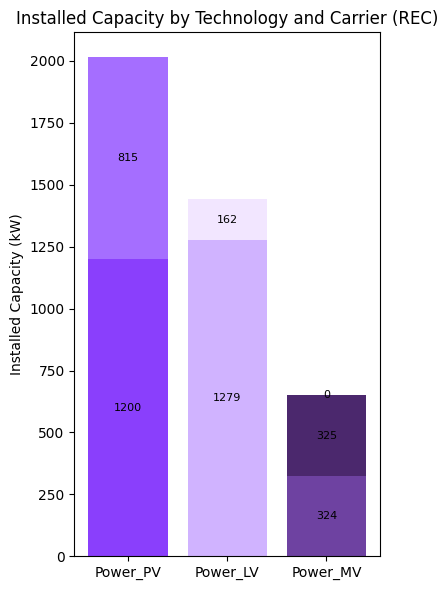

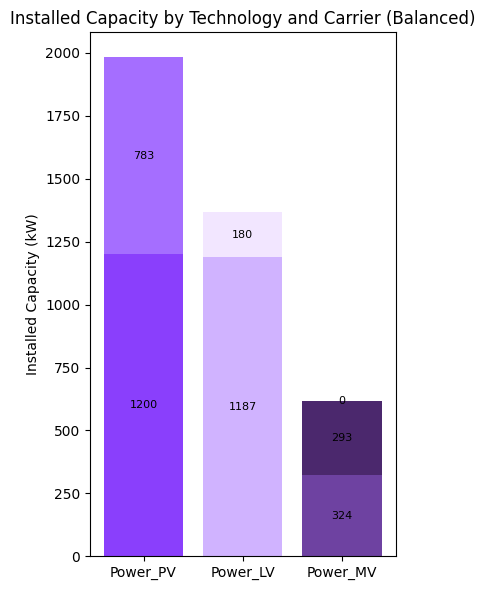

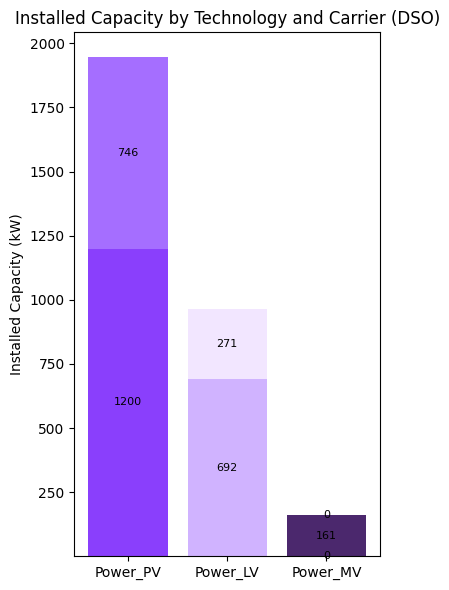

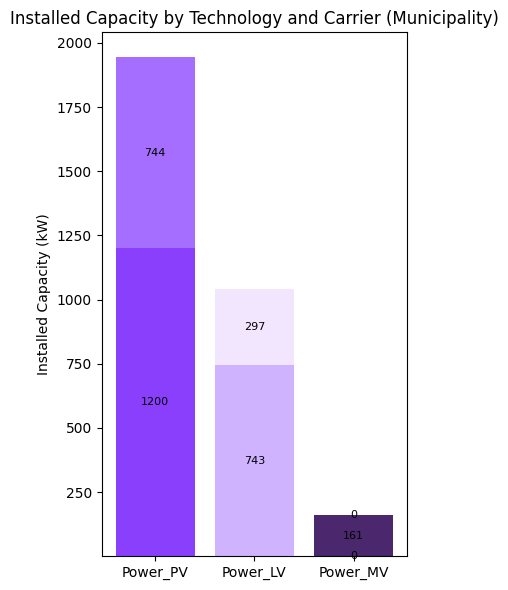

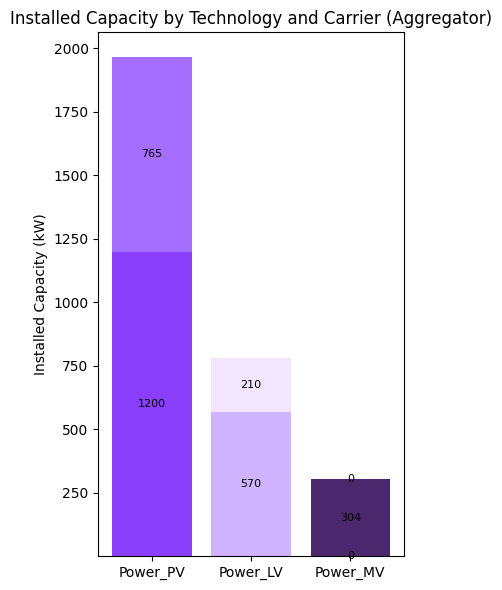

In [27]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the file paths for the four scenarios
file_paths = {
    "REC": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p733_wc0p167_wt0p1.nc",
    "Balanced": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p667_wc0p167_wt0p167.nc",
    "DSO": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p333_wc0p267_wt0p4.nc",
    "Municipality": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p233_wc0p5_wt0p267.nc",
    "Aggregator": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p533_wc0p2_wt0p267.nc",
}

# Define a function to process and plot a scenario
def process_and_plot_scenario(file_path, scenario_name):
    try:
        # Load the model data
        model = xr.open_dataset(file_path)

        # Check if required variables exist
        if "flow_cap" not in model.variables:
            raise ValueError(f"Required variables missing in {scenario_name} dataset.")

        # Extract installed capacity from `flow_cap`
        df_capacity = (
            model["flow_cap"]
            .sum(dim="nodes")
            .to_dataframe(name="installed_capacity")
            .reset_index()
        )

        # Define technology groups
        selected_techs_power_PV = ["solar_power", "curtailment"]
        selected_techs_power_LV = ["pv", "battery"]
        selected_techs_power_MV = ["sell_grid_power", "supply_grid_power", "battery_central"]

        df_power_PV = df_capacity[df_capacity["techs"].isin(selected_techs_power_PV)].copy()
        df_power_LV = df_capacity[df_capacity["techs"].isin(selected_techs_power_LV)].copy()
        df_power_MV = df_capacity[df_capacity["techs"].isin(selected_techs_power_MV)].copy()

        # Create a stacked bar chart
        fig, ax = plt.subplots(figsize=(4, 6))
        bar_width = 0.8
        bar_positions = np.arange(3)

        # Accenture color palette
        #colors = ['#633194', '#FF8200', '#A3A3A3', '#0070D2', '#34A853', '#EA4335', '#FFB900']
        #colors = ['#A100FF', '#7D00FF', '#5F00FF', '#9F00DF', '#6B286D', '#3F3F9F', '#8F7F7D']
        colors = ['#8A3FFC', '#A56EFF', '#D0B3FF', '#F2E6FF', '#6E42A1', '#4B286D', '#2C1A3C']



        # Plot Power_PV
        bottom_pv = 0
        for i, tech in enumerate(selected_techs_power_PV):
            values = df_power_PV[df_power_PV["techs"] == tech]["installed_capacity"].sum()
            bar = ax.bar(bar_positions[0], values, bar_width, color=colors[i], label=tech, bottom=bottom_pv)
            ax.text(bar_positions[0], bottom_pv + values / 2, f'{values:.0f}', ha='center', va='center', fontsize=8)
            bottom_pv += values

        # Plot Power_LV
        bottom_lv = 0
        for i, tech in enumerate(selected_techs_power_LV):
            values = df_power_LV[df_power_LV["techs"] == tech]["installed_capacity"].sum()
            bar = ax.bar(bar_positions[1], values, bar_width, color=colors[i + len(selected_techs_power_PV)], label=tech, bottom=bottom_lv)
            ax.text(bar_positions[1], bottom_lv + values / 2, f'{values:.0f}', ha='center', va='center', fontsize=8)
            bottom_lv += values

        # Plot Power_MV
        bottom_mv = 0
        for i, tech in enumerate(selected_techs_power_MV):
            values = df_power_MV[df_power_MV["techs"] == tech]["installed_capacity"].sum()
            bar = ax.bar(bar_positions[2], values, bar_width, color=colors[i + len(selected_techs_power_PV) + len(selected_techs_power_LV)], label=tech, bottom=bottom_mv)
            ax.text(bar_positions[2], bottom_mv + values / 2, f'{values:.0f}', ha='center', va='center', fontsize=8)
            bottom_mv += values

        # Add labels and formatting
        ax.set_xticks(bar_positions)
        ax.set_xticklabels(['Power_PV', 'Power_LV', 'Power_MV'])
        ax.set_ylabel('Installed Capacity (kW)')
        ax.set_title(f'Installed Capacity by Technology and Carrier ({scenario_name})')
        #ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing scenario '{scenario_name}': {e}")

# Loop through all scenarios and plot
for scenario_name, file_path in file_paths.items():
    process_and_plot_scenario(file_path, scenario_name)


Explanation to this plot: 
As long as solar_power * capacity_factor - curtailment < pv, the model works as intended. (MAX capacity factor = 0.86)
This is because we should always be able to remove enough energy from the system. 
This result is validated from these plots as:
1200*0.86 - 765 = 267 
285 > 267
Thus enough energy can be removed from the Power_PV subsystem. 

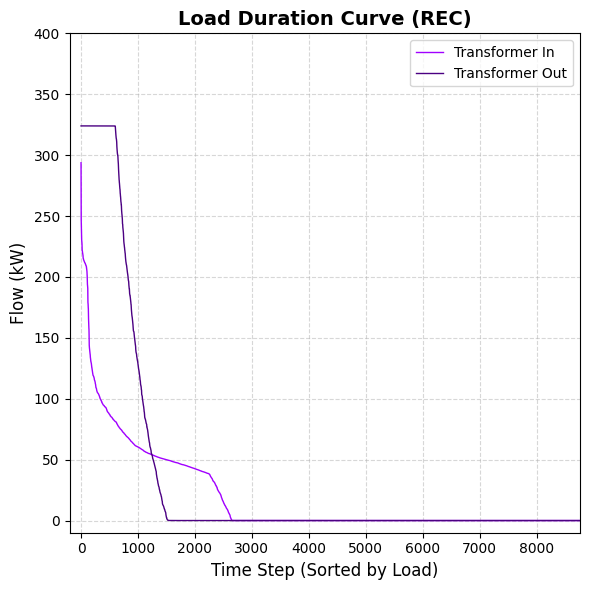

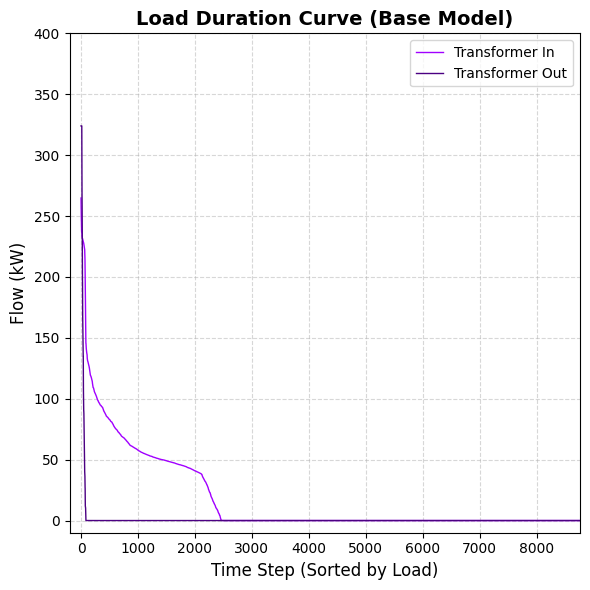

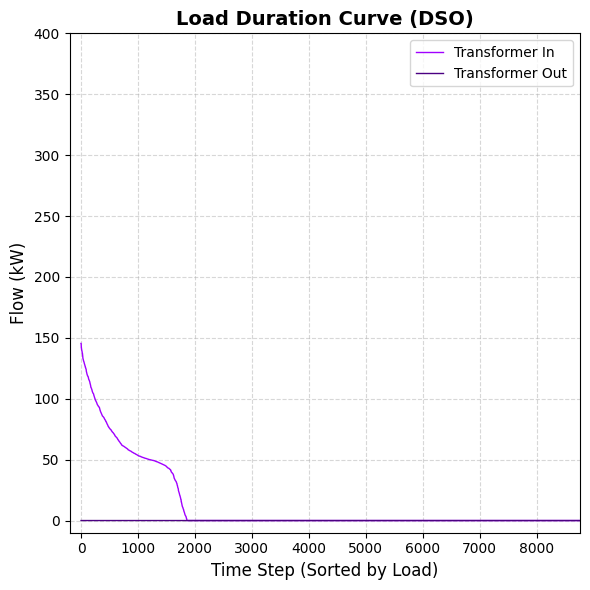

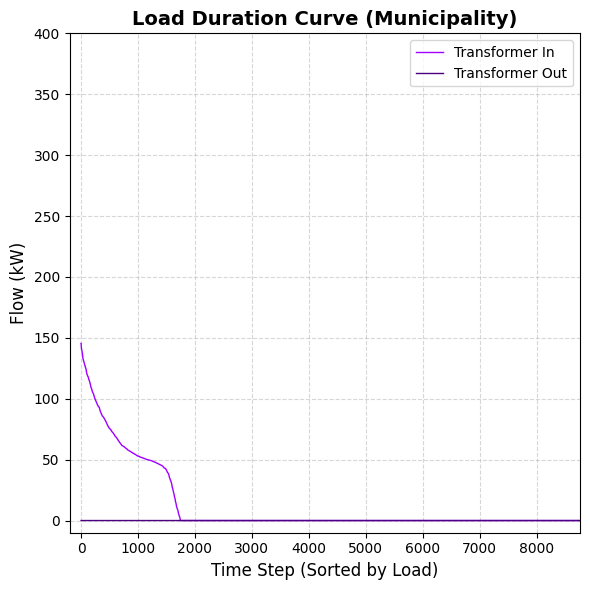

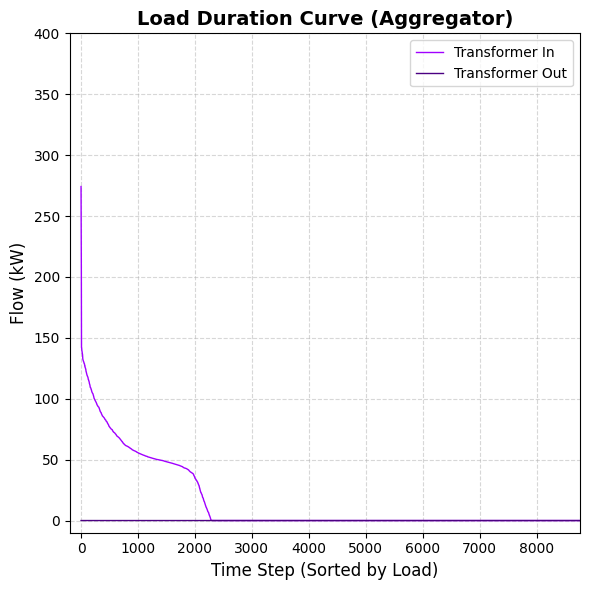

In [ ]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the file paths for the five scenarios
file_paths = {
    "REC": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p733_wc0p167_wt0p1.nc",
    "Base Model": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p667_wc0p167_wt0p167.nc",
    "DSO": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p333_wc0p267_wt0p4.nc",
    "Municipality": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p233_wc0p5_wt0p267.nc",
    "Aggregator": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p533_wc0p2_wt0p267.nc",
}

# Define consistent colors for transformer_in and transformer_out
COLOR_TRANSFORMER_IN = '#A100FF'  # Accenture Purple
COLOR_TRANSFORMER_OUT = '#4B0082'  # Accenture Indigo

# Define a function to process and plot Load Duration Curves for each scenario
def process_and_plot_ldc(file_path, scenario_name):
    try:
        # Load the model data
        model = xr.open_dataset(file_path)

        # Extract flow data for transformer_in and transformer_out
        transformer_in = model['flow_out'].sel(techs='transformer_in', nodes='transformer').fillna(0)
        transformer_out = model['flow_out'].sel(techs='transformer_out', nodes='transformer').fillna(0)

        # Convert to Pandas
        df_in = transformer_in.to_pandas()
        df_out = transformer_out.to_pandas()

        # Sum across timesteps if multiple dimensions exist
        if len(df_in.shape) > 1:
            df_in = df_in.sum(axis=0)
        if len(df_out.shape) > 1:
            df_out = df_out.sum(axis=0)

        # Sort in descending order for Load Duration Curve
        df_in_sorted = df_in.sort_values(ascending=False).reset_index(drop=True)
        df_out_sorted = df_out.sort_values(ascending=False).reset_index(drop=True)

        # Create smooth x-axis
        x_in = np.linspace(0, len(df_in_sorted)-1, len(df_in_sorted))
        x_out = np.linspace(0, len(df_out_sorted)-1, len(df_out_sorted))

        # Plot Load Duration Curve
        plt.figure(figsize=(6, 6))
        plt.plot(x_in, df_in_sorted, label='Transformer In', color=COLOR_TRANSFORMER_IN, linewidth=1)
        plt.plot(x_out, df_out_sorted, label='Transformer Out', color=COLOR_TRANSFORMER_OUT, linewidth=1)

        # Add titles and labels
        plt.title(f'Load Duration Curve ({scenario_name})', fontsize=14, fontweight='bold')
        plt.xlabel('Time Step (Sorted by Load)', fontsize=12)
        plt.ylabel('Flow (kW)', fontsize=12)
        plt.legend(fontsize=10)
        plt.xlim(-200, 8760)  # x-axis limited to 8760 hours
        plt.ylim(-10, 400)    # y-axis limited to 400 kW

        # Grid and layout
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing scenario '{scenario_name}': {e}")

# Loop through all scenarios and plot their Load Duration Curves
for scenario_name, file_path in file_paths.items():
    process_and_plot_ldc(file_path, scenario_name)


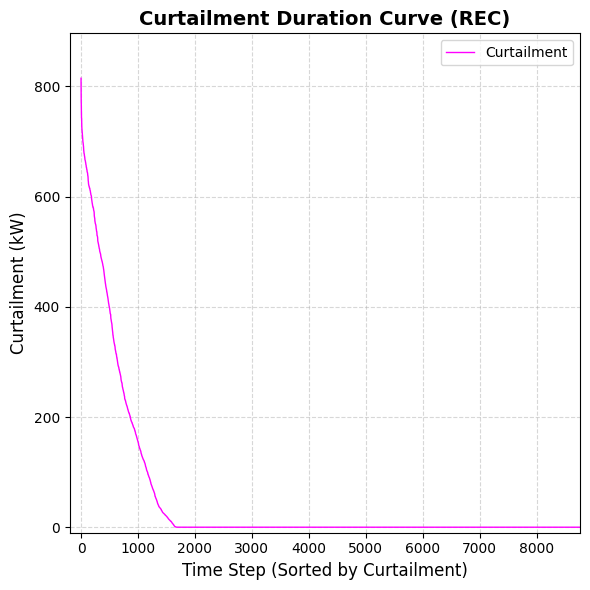

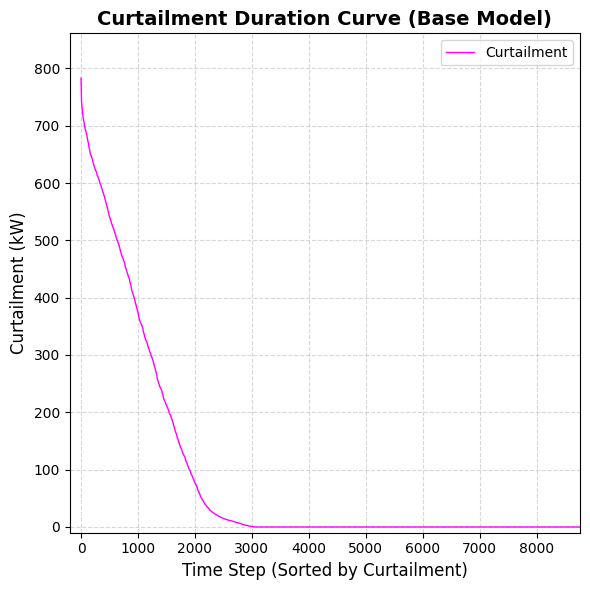

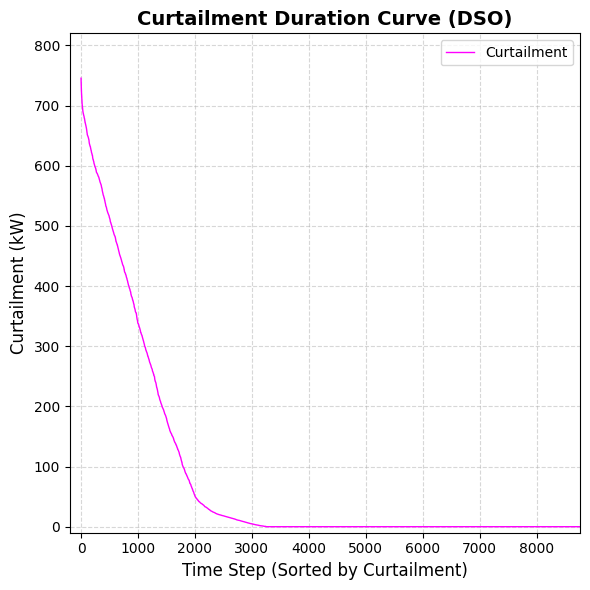

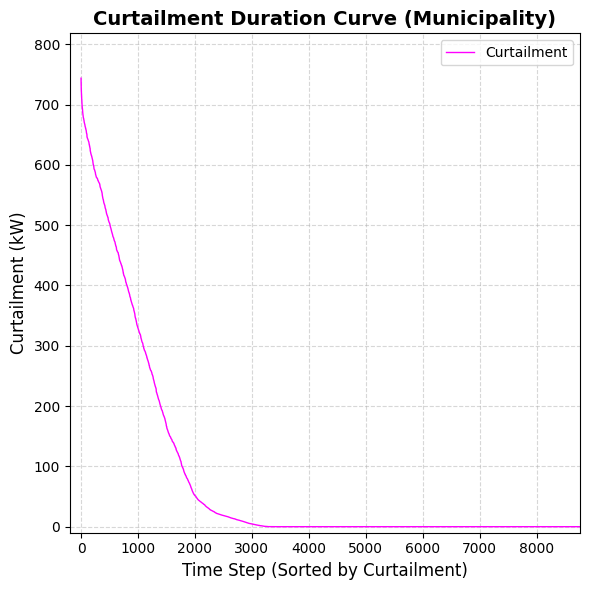

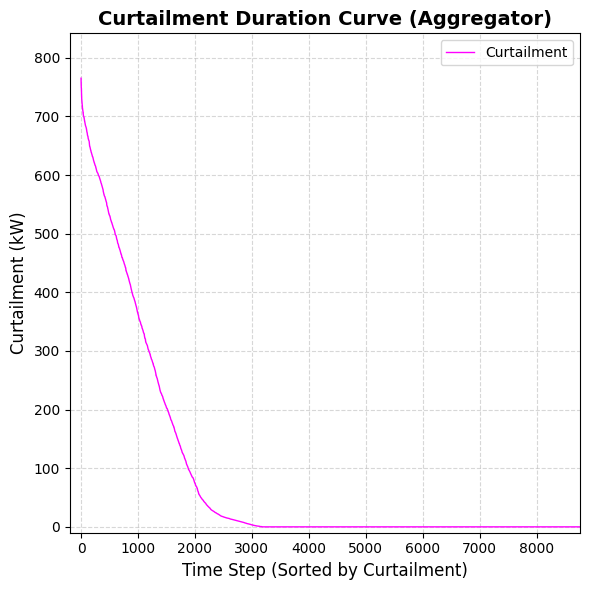

In [3]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the file paths for the five scenarios
file_paths = {
    "REC": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p733_wc0p167_wt0p1.nc",
    "Base Model": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p667_wc0p167_wt0p167.nc",
    "DSO": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p333_wc0p267_wt0p4.nc",
    "Municipality": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p233_wc0p5_wt0p267.nc",
    "Aggregator": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p533_wc0p2_wt0p267.nc",
}

# Define colors for curtailment
COLOR_CURTAILMENT = '#FF00FF'  # Matching YAML definition for Curtailment

# Define a function to process and plot Curtailment Duration Curves for each scenario
def process_and_plot_cdc(file_path, scenario_name):
    try:
        # Load the model data
        model = xr.open_dataset(file_path)
        
        # Extract curtailment flow data (as defined in YAML)
        curtailment = model['flow_in'].sel(techs='curtailment').sum(dim='nodes').fillna(0)
        
        # Convert to Pandas
        df_curtailment = curtailment.to_pandas()

        # Sum across timesteps if multiple dimensions exist
        if len(df_curtailment.shape) > 1:
            df_curtailment = df_curtailment.sum(axis=0)

        # Sort in descending order for Curtailment Duration Curve
        df_curtailment_sorted = df_curtailment.sort_values(ascending=False).reset_index(drop=True)

        # Create smooth x-axis
        x_curtailment = np.linspace(0, len(df_curtailment_sorted)-1, len(df_curtailment_sorted))

        # Plot Curtailment Duration Curve
        plt.figure(figsize=(6, 6))
        plt.plot(x_curtailment, df_curtailment_sorted, label='Curtailment', color=COLOR_CURTAILMENT, linewidth=1)

        # Add titles and labels
        plt.title(f'Curtailment Duration Curve ({scenario_name})', fontsize=14, fontweight='bold')
        plt.xlabel('Time Step (Sorted by Curtailment)', fontsize=12)
        plt.ylabel('Curtailment (kW)', fontsize=12)
        plt.legend(fontsize=10)
        plt.xlim(-200, 8760)  # x-axis limited to 8760 hours
        plt.ylim(-10, max(df_curtailment_sorted) * 1.1)  # Auto-scale y-axis with buffer

        # Grid and layout
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

    except KeyError as ke:
        print(f"Key Error in scenario '{scenario_name}': {ke}")
    except Exception as e:
        print(f"Error processing scenario '{scenario_name}': {e}")


# Loop through all scenarios and plot their Curtailment Duration Curves
for scenario_name, file_path in file_paths.items():
    process_and_plot_cdc(file_path, scenario_name)


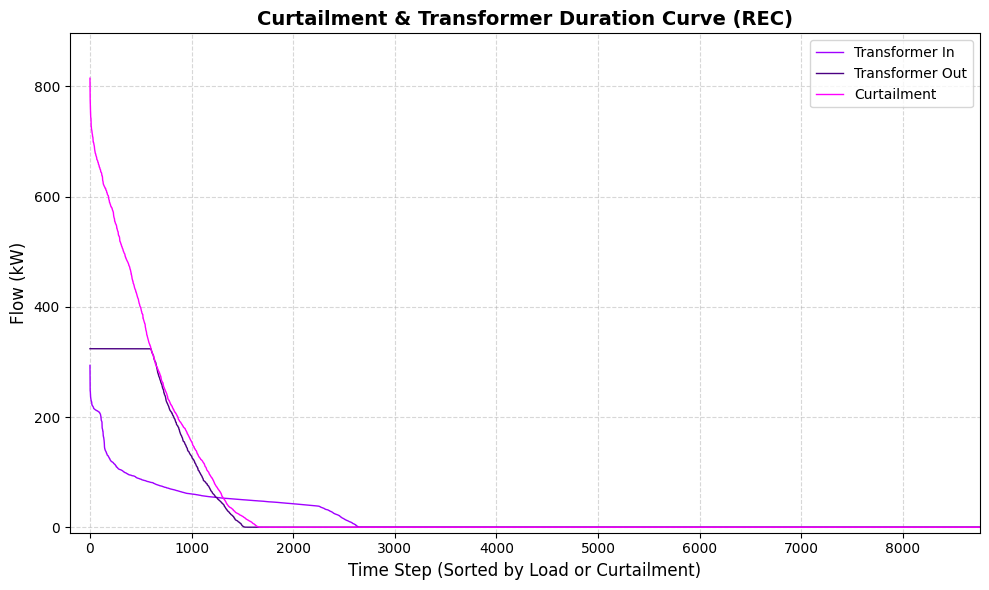

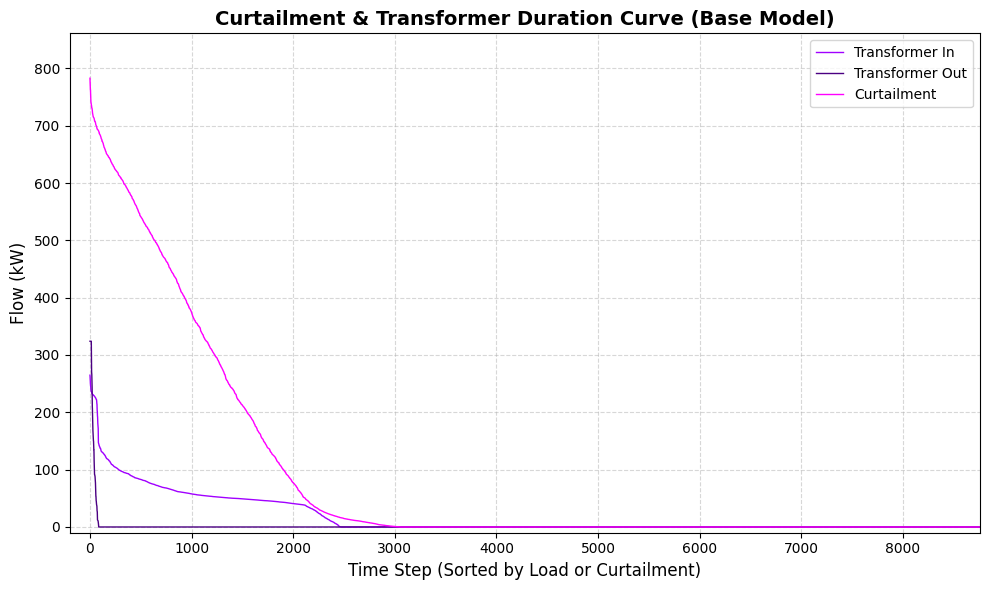

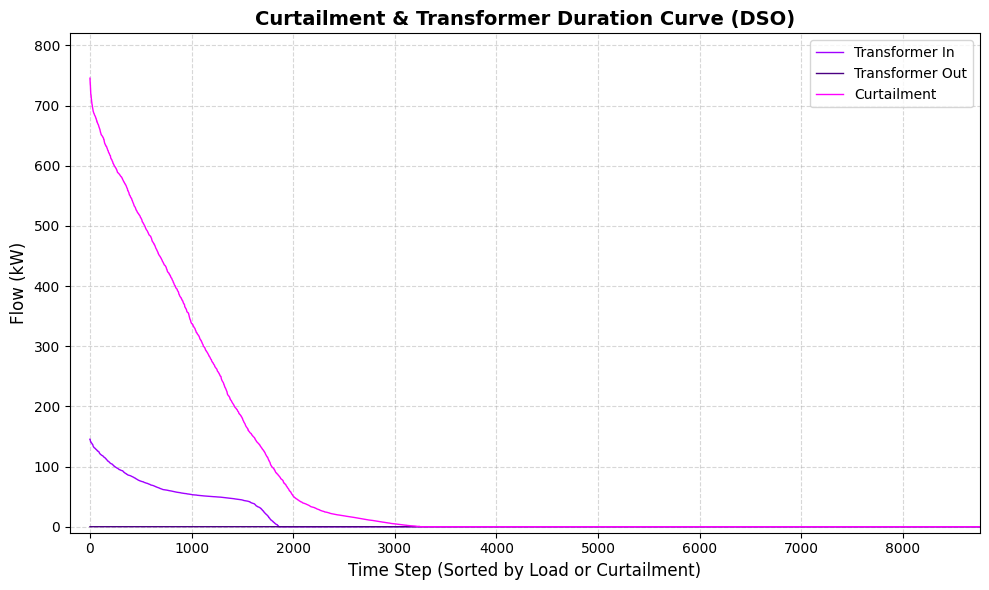

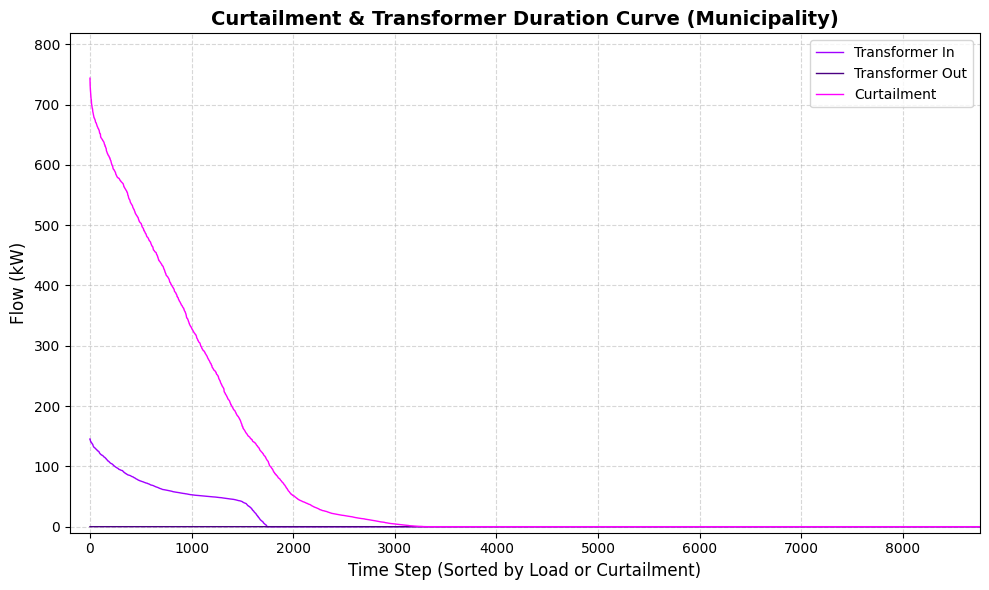

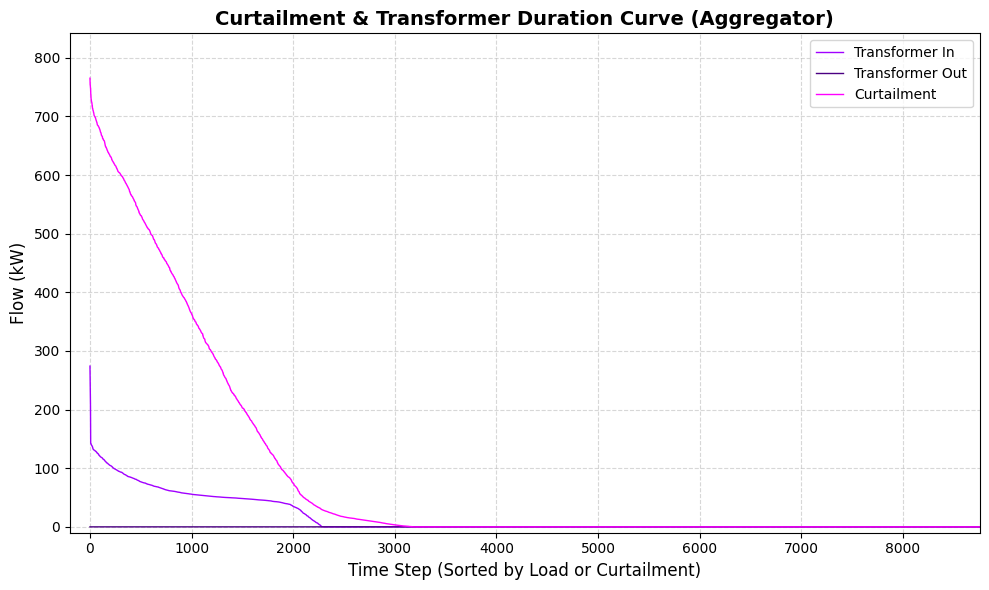

In [ ]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the file paths for the five scenarios
file_paths = {
    "REC": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p733_wc0p167_wt0p1.nc",
    "Base Model": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p667_wc0p167_wt0p167.nc",
    "DSO": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p333_wc0p267_wt0p4.nc",
    "Municipality": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p233_wc0p5_wt0p267.nc",
    "Aggregator": "/Users/tomdebruin/Library/CloudStorage/OneDrive-DelftUniversityofTechnology/00 THESIS/00 Working Docs/V4/Experiments/pareto_fronts/pareto_front_runs/run_wm0p533_wc0p2_wt0p267.nc",
}

# Define colors for the plots
COLOR_TRANSFORMER_IN = '#A100FF'  # Accenture Purple
COLOR_TRANSFORMER_OUT = '#4B0082'  # Accenture Indigo
COLOR_CURTAILMENT = '#FF00FF'  # Curtailment Pink

# Combined Plot Function
def process_and_plot_combined(file_path, scenario_name):
    try:
        # Load the model data
        model = xr.open_dataset(file_path)

        # --- Transformer Data ---
        transformer_in = model['flow_out'].sel(techs='transformer_in', nodes='transformer').fillna(0)
        transformer_out = model['flow_out'].sel(techs='transformer_out', nodes='transformer').fillna(0)

        df_in = transformer_in.to_pandas()
        df_out = transformer_out.to_pandas()

        if len(df_in.shape) > 1:
            df_in = df_in.sum(axis=0)
        if len(df_out.shape) > 1:
            df_out = df_out.sum(axis=0)

        df_in_sorted = df_in.sort_values(ascending=False).reset_index(drop=True)
        df_out_sorted = df_out.sort_values(ascending=False).reset_index(drop=True)

        x_in = np.linspace(0, len(df_in_sorted) - 1, len(df_in_sorted))
        x_out = np.linspace(0, len(df_out_sorted) - 1, len(df_out_sorted))

        # --- Curtailment Data ---
        curtailment = model['flow_in'].sel(techs='curtailment').sum(dim='nodes').fillna(0)
        df_curtailment = curtailment.to_pandas()

        if len(df_curtailment.shape) > 1:
            df_curtailment = df_curtailment.sum(axis=0)

        df_curtailment_sorted = df_curtailment.sort_values(ascending=False).reset_index(drop=True)
        x_curtailment = np.linspace(0, len(df_curtailment_sorted) - 1, len(df_curtailment_sorted))

        # --- Plot Combined ---
        plt.figure(figsize=(10, 6))
        plt.plot(x_in, df_in_sorted, label='Transformer In', color=COLOR_TRANSFORMER_IN, linewidth=1)
        plt.plot(x_out, df_out_sorted, label='Transformer Out', color=COLOR_TRANSFORMER_OUT, linewidth=1)
        plt.plot(x_curtailment, df_curtailment_sorted, label='Curtailment', color=COLOR_CURTAILMENT, linewidth=1)

        # Titles and Labels
        plt.title(f'Curtailment & Transformer Duration Curve ({scenario_name})', fontsize=14, fontweight='bold')
        plt.xlabel('Time Step (Sorted by Load or Curtailment)', fontsize=12)
        plt.ylabel('Flow (kW)', fontsize=12)
        plt.legend(fontsize=10)
        plt.xlim(-200, 8760)
        plt.ylim(-10, max(df_in_sorted.max(), df_out_sorted.max(), df_curtailment_sorted.max()) * 1.1)

        # Grid and Layout
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

    except KeyError as ke:
        print(f"Key Error in scenario '{scenario_name}': {ke}")
    except Exception as e:
        print(f"Error processing scenario '{scenario_name}': {e}")


# Loop through all scenarios and plot their combined Duration Curves
for scenario_name, file_path in file_paths.items():
    process_and_plot_combined(file_path, scenario_name)


In [8]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
BASE_DIR = "./perspective_runs"  # Folder containing .nc files for perspectives
OUTPUT_DIR = "./perspectives_loadduration_plots"  # Folder for saving plots

# Verify if the input directory exists
if not os.path.exists(BASE_DIR):
    raise FileNotFoundError(f"The directory '{BASE_DIR}' does not exist.")

# Create output directory if it doesn't exist
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Automatically collect .nc files and extract scenario names
file_paths = {}
for file in os.listdir(BASE_DIR):
    if file.endswith(".nc"):
        file_path = os.path.join(BASE_DIR, file)
        match = re.match(r"perspective_(.+)\.nc", file)
        scenario_name = match.group(1).replace("_", " ").title() if match else file.replace(".nc", "")
        file_paths[scenario_name] = file_path

# Validate file existence
if not file_paths:
    raise FileNotFoundError("[ERROR] No valid .nc files found in the specified directory.")

# ----------------------------
# 🎨 Accenture Color Palette
# ----------------------------
tech_colors = {
    "supply_grid_power": "#FF5733",   # Bright Orange
    "solar_power": "#33FF57",         # Bright Green
    "unmet_demand": "#FF3357",        # Bright Red
    "demand_power": "#000000",        # Black (kept for clarity)
    "sell_grid_power": "#3357FF",     # Bright Blue
    "curtailment": "#FF33A8",         # Bright Pink
    "transformer_in": "#A833FF",      # Bright Purple
    "transformer_out": "#33FFF5",     # Bright Cyan
    "pv": "#FFC300",                  # Bright Yellow
    "battery_in": "#DAF7A6",          # Light Green
    "battery_out": "#C70039"          # Crimson Red
}

# Technology names based on YAML
tech_names = {
    "supply_grid_power": "Grid buy",
    "solar_power": "Solar power",
    "unmet_demand": "Unmet demand",
    "demand_power": "Power demand",
    "sell_grid_power": "Grid sell",
    "curtailment": "Curtailment",
    "transformer_in": "Transformer in",
    "transformer_out": "Transformer out",
    "pv": "PV",
    "battery_in": "Battery charge",
    "battery_out": "Battery discharge"
}

# ----------------------------
# 📊 Plot Duration Curve
# ----------------------------
def process_and_plot_combined(file_path, scenario_name):
    """
    Generate and save duration curve plots for a given scenario.
    """
    try:
        # Load the model data
        model = xr.open_dataset(file_path)

        # --- Transformer Data ---
        transformer_in = model['flow_out'].sel(techs='transformer_in').sum(dim='nodes').fillna(0)
        transformer_out = model['flow_out'].sel(techs='transformer_out').sum(dim='nodes').fillna(0)

        df_in_sorted = transformer_in.to_pandas().sort_values(ascending=False).reset_index(drop=True)
        df_out_sorted = transformer_out.to_pandas().sort_values(ascending=False).reset_index(drop=True)

        x_in = np.linspace(0, len(df_in_sorted) - 1, len(df_in_sorted))
        x_out = np.linspace(0, len(df_out_sorted) - 1, len(df_out_sorted))

        # --- PV Data ---
        pv = model['flow_out'].sel(techs='pv').sum(dim='nodes').fillna(0)
        df_pv_sorted = pv.to_pandas().sort_values(ascending=False).reset_index(drop=True)
        x_pv = np.linspace(0, len(df_pv_sorted) - 1, len(df_pv_sorted))

        # --- Battery Data ---
        battery_in = model['flow_in'].sel(techs='battery').sum(dim='nodes').fillna(0)
        battery_out = model['flow_out'].sel(techs='battery').sum(dim='nodes').fillna(0)

        df_battery_in_sorted = battery_in.to_pandas().sort_values(ascending=False).reset_index(drop=True)
        df_battery_out_sorted = battery_out.to_pandas().sort_values(ascending=False).reset_index(drop=True)
        x_battery_in = np.linspace(0, len(df_battery_in_sorted) - 1, len(df_battery_in_sorted))
        x_battery_out = np.linspace(0, len(df_battery_out_sorted) - 1, len(df_battery_out_sorted))

        # --- Plot Combined ---
        plt.figure(figsize=(12, 6))
        plt.plot(x_in, df_in_sorted, label=tech_names['transformer_in'], color=tech_colors['transformer_in'], linewidth=1)
        plt.plot(x_out, df_out_sorted, label=tech_names['transformer_out'], color=tech_colors['transformer_out'], linewidth=1)
        plt.plot(x_pv, df_pv_sorted, label=tech_names['pv'], color=tech_colors['pv'], linewidth=1)
        plt.plot(x_battery_in, df_battery_in_sorted, label=tech_names['battery_in'], color=tech_colors['battery_in'], linewidth=1)
        plt.plot(x_battery_out, df_battery_out_sorted, label=tech_names['battery_out'], color=tech_colors['battery_out'], linewidth=1)

        # Titles and Labels
        plt.title(f'Transformer, PV, and Battery Duration Curve ({scenario_name})', fontsize=14, fontweight='bold', fontname='Times New Roman')
        plt.xlabel('Time Step (Sorted by Load or Output)', fontsize=12, fontname='Times New Roman')
        plt.ylabel('Flow (kW)', fontsize=12, fontname='Times New Roman')
        plt.legend(fontsize=10, loc='upper right')
        plt.xlim(0, 8760)
        plt.ylim(0, 700)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()

        # Save Plot
        plot_filename = os.path.join(OUTPUT_DIR, f"{scenario_name.replace(' ', '_')}_duration_curve.png")
        plt.savefig(plot_filename, dpi=300)
        plt.close()
        print(f"[INFO] Saved plot: {plot_filename}")

    except Exception as e:
        print(f"[ERROR] Processing scenario '{scenario_name}' failed: {e}")


# ----------------------------
# ▶️ Run Scenarios
# ----------------------------
if __name__ == "__main__":
    for scenario_name, file_path in file_paths.items():
        print(f"[INFO] Plotting scenario: {scenario_name}")
        process_and_plot_combined(file_path, scenario_name)

[INFO] Plotting scenario: Dso
[ERROR] Processing scenario 'Dso' failed: DataFrame.sort_values() missing 1 required positional argument: 'by'
[INFO] Plotting scenario: Municipality
[ERROR] Processing scenario 'Municipality' failed: DataFrame.sort_values() missing 1 required positional argument: 'by'
[INFO] Plotting scenario: Aggregator
[ERROR] Processing scenario 'Aggregator' failed: DataFrame.sort_values() missing 1 required positional argument: 'by'
[INFO] Plotting scenario: Rec Particpant
[ERROR] Processing scenario 'Rec Particpant' failed: DataFrame.sort_values() missing 1 required positional argument: 'by'
[INFO] Plotting scenario: Base
[ERROR] Processing scenario 'Base' failed: DataFrame.sort_values() missing 1 required positional argument: 'by'


In [12]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re

# ----------------------------
# 📂 Paths and Directories
# ----------------------------
BASE_DIR = "./perspective_runs"  # Folder containing .nc files for perspectives
OUTPUT_DIR = "./perspectives_loadduration_plots"  # Folder for saving plots

# Verify if the input directory exists
if not os.path.exists(BASE_DIR):
    raise FileNotFoundError(f"The directory '{BASE_DIR}' does not exist.")

# Create output directory if it doesn't exist
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Automatically collect .nc files and extract scenario names
file_paths = {}
for file in os.listdir(BASE_DIR):
    if file.endswith(".nc"):
        file_path = os.path.join(BASE_DIR, file)
        match = re.match(r"perspective_(.+)\.nc", file)
        scenario_name = match.group(1).replace("_", " ").title() if match else file.replace(".nc", "")
        file_paths[scenario_name] = file_path

# Validate file existence
if not file_paths:
    raise FileNotFoundError("[ERROR] No valid .nc files found in the specified directory.")

# ----------------------------
# 🎨 Accenture Color Palette
# ----------------------------
tech_colors = {
    "supply_grid_power": "#FF5733",   # Bright Orange
    "solar_power": "#33FF57",         # Bright Green
    "unmet_demand": "#FF3357",        # Bright Red
    "demand_power": "#000000",        # Black (kept for clarity)
    "sell_grid_power": "#3357FF",     # Bright Blue
    "curtailment": "#FF33A8",         # Bright Pink
    "transformer_in": "#A833FF",      # Bright Purple
    "transformer_out": "#33FFF5",     # Bright Cyan
    "pv": "#FFC300",                  # Bright Yellow
    "battery_in": "#DAF7A6",          # Light Green
    "battery_out": "#C70039"          # Crimson Red
}

# Technology names based on YAML
tech_names = {
    "supply_grid_power": "Grid buy",
    "solar_power": "Solar power",
    "unmet_demand": "Unmet demand",
    "demand_power": "Power demand",
    "sell_grid_power": "Grid sell",
    "curtailment": "Curtailment",
    "transformer_in": "Transformer in",
    "transformer_out": "Transformer out",
    "pv": "PV",
    "battery_in": "Battery charge",
    "battery_out": "Battery discharge"
}

# ----------------------------
# 📊 Plot Duration Curve
# ----------------------------
def extract_and_sort(data):
    """Ensure data is summed across nodes and sorted as a Series."""
    if len(data.shape) > 1:
        data = data.sum(dim='nodes')  # Sum across nodes if multiple dimensions exist
    data = data.to_series().fillna(0)
    return data.sort_values(ascending=False).reset_index(drop=True)

def process_and_plot_combined(file_path, scenario_name):
    """
    Generate and save duration curve plots for a given scenario.
    """
    try:
        # Load the model data
        model = xr.open_dataset(file_path)

        # --- Transformer Data ---
        transformer_in = extract_and_sort(model['flow_out'].sel(techs='transformer_in'))
        transformer_out = extract_and_sort(model['flow_out'].sel(techs='transformer_out'))

        x_in = np.linspace(0, len(transformer_in) - 1, len(transformer_in))
        x_out = np.linspace(0, len(transformer_out) - 1, len(transformer_out))

        # --- PV Data ---
        pv = extract_and_sort(model['flow_out'].sel(techs='pv'))
        x_pv = np.linspace(0, len(pv) - 1, len(pv))

        # --- Battery Data ---
        battery_in = extract_and_sort(model['flow_in'].sel(techs='battery'))
        battery_out = extract_and_sort(model['flow_out'].sel(techs='battery'))

        x_battery_in = np.linspace(0, len(battery_in) - 1, len(battery_in))
        x_battery_out = np.linspace(0, len(battery_out) - 1, len(battery_out))

        # --- Plot Combined ---
        plt.figure(figsize=(12, 6))
        plt.plot(x_in, transformer_in, label=tech_names['transformer_in'], color=tech_colors['transformer_in'], linewidth=1)
        plt.plot(x_out, transformer_out, label=tech_names['transformer_out'], color=tech_colors['transformer_out'], linewidth=1)
        plt.plot(x_pv, pv, label=tech_names['pv'], color=tech_colors['pv'], linewidth=1)
        plt.plot(x_battery_in, battery_in, label=tech_names['battery_in'], color=tech_colors['battery_in'], linewidth=1)
        plt.plot(x_battery_out, battery_out, label=tech_names['battery_out'], color=tech_colors['battery_out'], linewidth=1)

        # Titles and Labels
        plt.title(f'Transformer, PV, and Battery Duration Curve ({scenario_name})', fontsize=14, fontweight='bold', fontname='Times New Roman')
        plt.xlabel('Time Step (Sorted by Load or Output)', fontsize=12, fontname='Times New Roman')
        plt.ylabel('Flow (kW)', fontsize=12, fontname='Times New Roman')
        plt.legend(fontsize=10, loc='upper right')
        plt.xlim(0, 8760)
        plt.ylim(0, 700)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()

        # Save Plot
        plot_filename = os.path.join(OUTPUT_DIR, f"{scenario_name.replace(' ', '_')}_duration_curve.png")
        plt.savefig(plot_filename, dpi=300)
        plt.close()
        print(f"[INFO] Saved plot: {plot_filename}")

    except Exception as e:
        print(f"[ERROR] Processing scenario '{scenario_name}' failed: {e}")


# ----------------------------
# ▶️ Run Scenarios
# ----------------------------
if __name__ == "__main__":
    for scenario_name, file_path in file_paths.items():
        print(f"[INFO] Plotting scenario: {scenario_name}")
        process_and_plot_combined(file_path, scenario_name)

[INFO] Plotting scenario: cluster_0
[INFO] Saved plot: ./perspectives_loadduration_plots/cluster_0_duration_curve.png
[INFO] Plotting scenario: cluster_1
[INFO] Saved plot: ./perspectives_loadduration_plots/cluster_1_duration_curve.png
[INFO] Plotting scenario: cluster_2
[INFO] Saved plot: ./perspectives_loadduration_plots/cluster_2_duration_curve.png
[INFO] Plotting scenario: cluster_3
[INFO] Saved plot: ./perspectives_loadduration_plots/cluster_3_duration_curve.png
